In [23]:
#load python packages
import os
import pandas as pd
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
from pandas_profiling.utils.cache import cache_file
from pathlib import Path
from IPython.display import Image

import requests
import numpy as np
import pandas as pd

import pandas_profiling
from pandas_profiling import ProfileReport

In [224]:
plt.rcParams['figure.figsize'] = [12, 12]

**<font color='blue'> Load clean csv file as datframe </font>**

In [5]:
df = pd.read_csv(r'C:\Users\Jake Wojcik\Documents\Springboard\DS Career Track Course\Capstone_2\Data\clean_df.csv',index_col=[0])

# Cleaning 

**<font color='blue'> Create dataframes by position in order to see a variable relationships differences.</font>**

In [29]:
df['Position Standard'].value_counts()

DB    1021
LB     735
WR     717
RB     549
DE     491
DT     443
T      435
G      389
TE     342
QB     285
C      147
FB      58
K       17
P       13
LS       1
Name: Position Standard, dtype: int64

In [62]:
#Create Dataframe of skill players (RB,WR,DB)
df_skp = df[(df['Position Standard']== 'DB') | (df['Position Standard']=='WR') | (df['Position Standard']=='RB')]

In [64]:
#Create Dataframe of Quarterbacks
df_qb = df[df['Position Standard']== 'QB']
df_qb

,Player_id,Draft_Year,Rnd,Pick,Tm,Player,Position Standard,First4AV,Age,To,...,Hand Size (in),Arm Length (in),Wonderlic,40 Yard,Bench Press,Vert Leap (in),Broad Jump (in),Shuttle,3Cone,60Yd Shuttle
0,2015Jameis Winston,2015,1,1,TAM,Jameis Winston,QB,13,21,2016,...,9.38,32.00,27.0,4.97,NaN,28.5,103.0,4.36,7.16,NaN
1,2015Marcus Mariota,2015,1,2,TEN,Marcus Mariota,QB,9,21,2016,...,9.88,32.00,NaN,4.52,NaN,36.0,121.0,4.11,6.87,NaN
73,2015Garrett Grayson,2015,3,75,NOR,Garrett Grayson,QB,0,24,2015,...,10.00,30.00,20.0,4.84,NaN,NaN,NaN,NaN,NaN,NaN
87,2015Sean Mannion,2015,3,89,STL,Sean Mannion,QB,0,23,2015,...,9.00,33.50,40.0,5.14,NaN,31.0,105.0,4.39,7.29,NaN
101,2015Bryce Petty,2015,4,103,NYJ,Bryce Petty,QB,0,24,2016,...,10.00,31.88,31.0,4.87,NaN,34.0,121.0,4.13,6.91,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5578,1987Kevin Sweeney,1987,7,180,DAL,Kevin Sweeney,QB,2,23,1988,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5582,1987Doug Hudson,1987,7,186,KAN,Doug Hudson,QB,0,23,1987,...,7.25,29.00,NaN,4.86,NaN,25.0,105.0,4.52,NaN,NaN
5611,1987Don Majkowski,1987,10,255,GNB,Don Majkowski,QB,36,23,1996,...,9.00,32.25,NaN,4.83,NaN,34.0,116.0,4.13,NaN,NaN
5634,1987Mike Shula,1987,12,313,TAM,Mike Shula,QB,0,22,1987,...,NaN,NaN,NaN,5.13,2.0,26.5,99.0,4.49,NaN,NaN


In [101]:
df.Draft_Year.value_counts()

1992    264
1991    253
2015    234
2012    219
1987    204
1999    203
2014    202
1990    202
1988    202
2011    197
2010    196
2013    194
2006    191
1989    190
2005    189
2009    188
1993    187
1997    187
2001    187
2008    183
1996    183
2003    182
2007    178
1994    174
2002    174
2004    173
1995    173
1998    168
2000    166
Name: Draft_Year, dtype: int64

In [65]:
#Create Dataframe of Defensive linemen
df_dl = df[(df['Position Standard']== 'DE') | (df['Position Standard']=='DT')]
df_dl

,Player_id,Draft_Year,Rnd,Pick,Tm,Player,Position Standard,First4AV,Age,To,...,Hand Size (in),Arm Length (in),Wonderlic,40 Yard,Bench Press,Vert Leap (in),Broad Jump (in),Shuttle,3Cone,60Yd Shuttle
5,2015Leonard Williams,2015,1,6,NYJ,Leonard Williams,DE,9,21,2016,...,10.63,34.63,22.0,4.97,NaN,29.5,106.0,4.53,7.59,NaN
12,2015Danny Shelton,2015,1,12,CLE,Danny Shelton,DT,6,22,2016,...,10.25,32.00,23.0,5.64,34.0,30.5,95.0,4.65,7.99,NaN
17,2015Arik Armstead,2015,1,17,SFO,Arik Armstead,DT,1,21,2016,...,10.50,33.00,26.0,5.10,24.0,34.0,117.0,4.53,7.57,NaN
22,2015Shane Ray,2015,1,23,DEN,Shane Ray,DE,2,22,2016,...,9.00,33.13,20.0,4.65,21.0,NaN,NaN,NaN,NaN,NaN
31,2015Malcom Brown,2015,1,32,NWE,Malcom Brown,DT,7,21,2016,...,10.00,32.50,19.0,5.05,26.0,29.5,98.0,4.59,7.84,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5580,1987Roland Barbay,1987,7,184,SEA,Roland Barbay,DT,0,22,1987,...,10.00,32.50,NaN,5.18,13.0,21.5,91.0,4.59,NaN,NaN
5583,1987Gerald Nichols,1987,7,187,NYJ,Gerald Nichols,DT,10,23,1993,...,9.25,31.25,NaN,4.93,22.0,25.0,109.0,4.48,NaN,NaN
5587,1987Steve Alvord,1987,8,201,STL,Steve Alvord,DT,7,22,1988,...,8.75,34.00,NaN,4.86,18.0,28.5,108.0,4.49,NaN,NaN
5590,1987Bruce Mesner,1987,8,209,BUF,Bruce Mesner,DT,1,23,1987,...,8.50,32.75,NaN,NaN,20.0,NaN,NaN,NaN,NaN,NaN


**<font color='blue'> Impute missing values</font>**

In [ ]:
df[''].fillna((df[''].mean()), inplace=True)


# Build data profile tables and plots

In [21]:
# Generate Profiling Report
profile_report = df.profile_report(html={'style': {'full_width': True}})
profile_report.to_file("clean_profile_report.html")

In [6]:
dft = df.describe().T
dft

,count,mean,std,min,25%,50%,75%,max
Draft_Year,5643.0,2000.931419,8.597487,1987.00,1993.00,2001.00,2009.0000,2015.00
Rnd,5643.0,4.339181,2.475789,1.00,2.00,4.00,6.0000,12.00
Pick,5643.0,121.753854,76.926261,1.00,57.00,115.00,180.0000,336.00
First4AV,5643.0,11.175084,13.524926,-4.00,1.00,5.00,18.0000,84.00
Age,5643.0,22.565479,0.821822,20.00,22.00,23.00,23.0000,28.00
To,5643.0,2005.062024,8.739021,1987.00,1998.00,2006.00,2013.0000,2016.00
AP1,5643.0,0.079390,0.464712,0.00,0.00,0.00,0.0000,7.00
PB,5643.0,0.295587,1.139270,0.00,0.00,0.00,0.0000,14.00
St,5643.0,2.048024,3.036234,0.00,0.00,0.00,3.0000,19.00
CarAV,4966.0,18.180226,22.608154,-4.00,2.00,9.00,27.0000,177.00


**<font color='blue'> Plot the histograms for all numeric features.</font>**

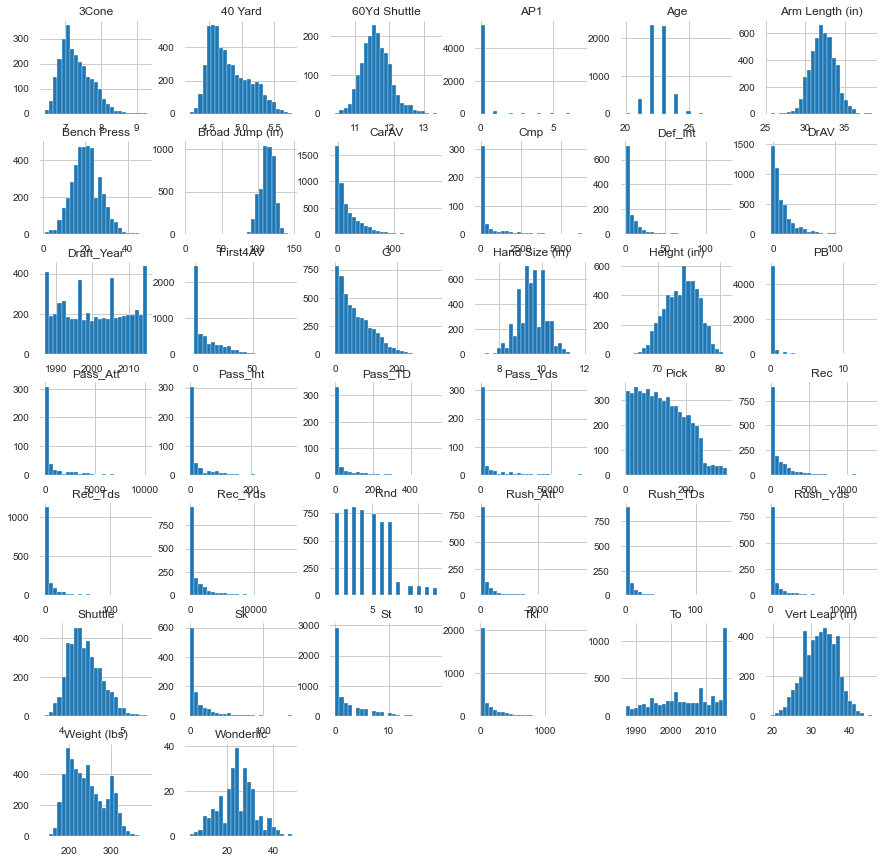

In [7]:
df.hist(bins=25,figsize=(15,15))
plt.show()

# Anamolies & Outliers - Review boxplots

C:\Users\public\Anaconda3\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


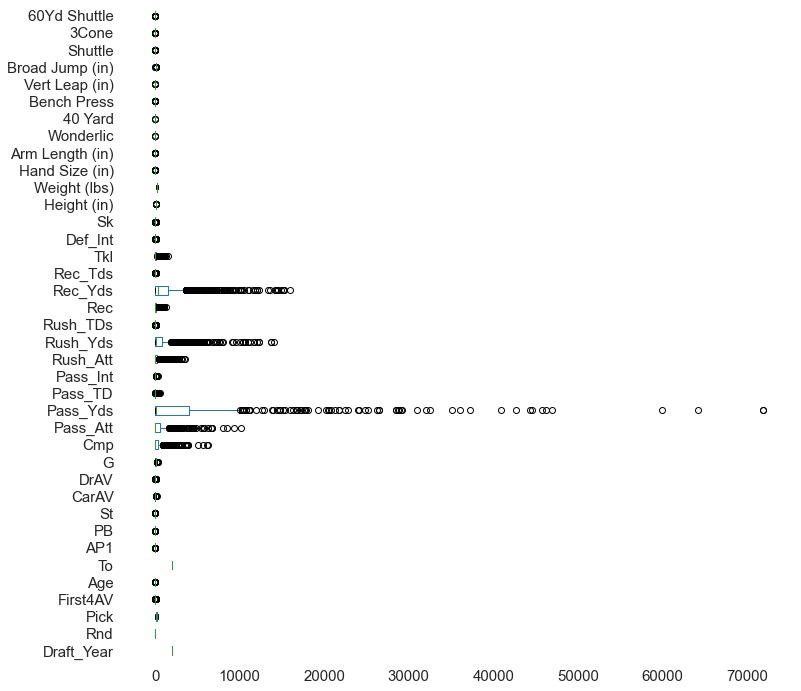

In [10]:
boxplot = df.boxplot(grid=False, vert=False,fontsize=15)

Outliers are consistent with what one would expect in the NFL. There are a few exceptional players and many average to below average players. For this reason I don't see any reason to remove any outliers.   

# Choosing a dependent variable

The goal of this project is to predict NFL performance based on Combine results. Therefore, choosing a response variable for NFL success must take into account several factors, as not all success in the NFL looks the same.  There are many response variables to choose from in the dataset including: All-Pro selections, Pro Bowl Selections, games started, games played, first 4 years approximate value, approximate value for the team that drafted the player, and finally, career approximate value. I believe the best response variable is career approximate value: a method of putting a single numerical value on any player's season, at any position. This numerical value takes into account a player's position so it doesn't favor skill positions like quarterback or receiver. Ultimately, it measures the overall value the player had for his team, which I believe is the greatest measure of success for a team sport like football. You can find more information on how approximate value is calculated here: https://www.sports-reference.com/blog/approximate-value-methodology/

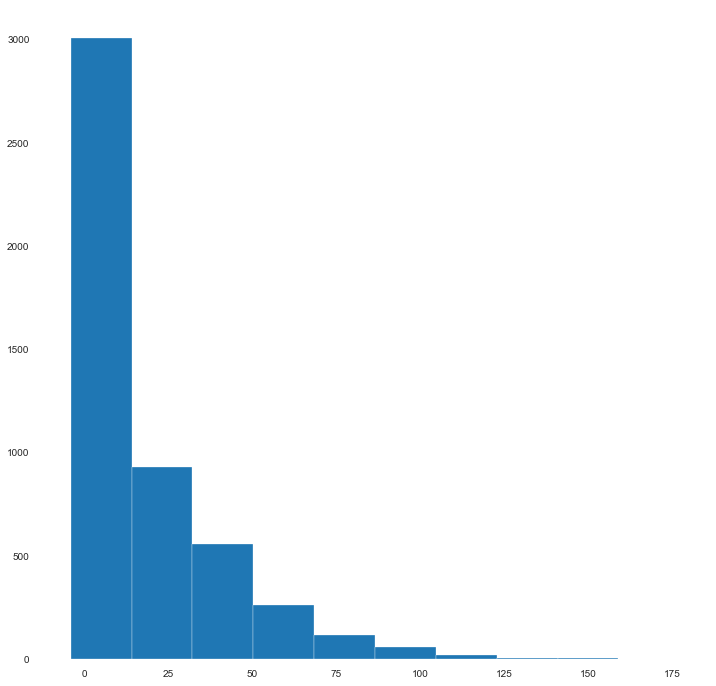

In [12]:
_ = plt.hist(df.CarAV)

In [16]:
df['CarAV'].describe()

count    4966.000000
mean       18.180226
std        22.608154
min        -4.000000
25%         2.000000
50%         9.000000
75%        27.000000
max       177.000000
Name: CarAV, dtype: float64

In [17]:
df.CarAV.value_counts()

 0.0      649
 1.0      473
 2.0      309
 3.0      246
 4.0      192
         ... 
 111.0      1
 128.0      1
 147.0      1
 141.0      1
-4.0        1
Name: CarAV, Length: 127, dtype: int64

# Explore Data Relationships

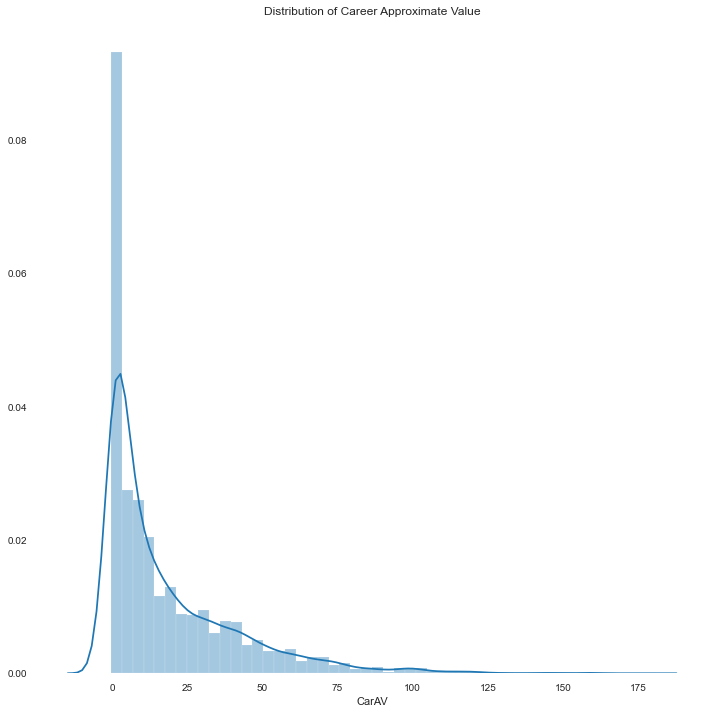

In [77]:
# Use distplot to view the distribution
sns.distplot(df['CarAV'].dropna())
plt.title("Distribution of Career Approximate Value")
plt.show()

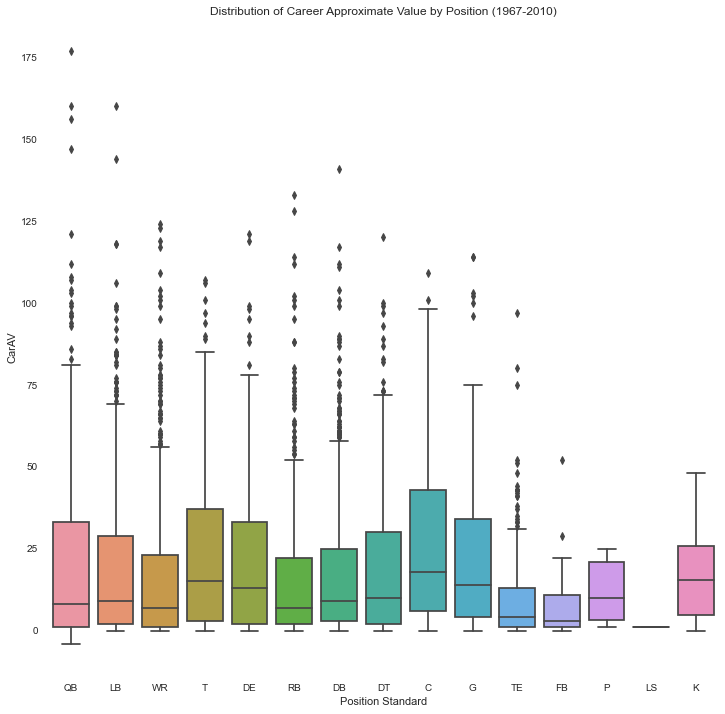

In [79]:
sns.boxplot(x="Position Standard", y="CarAV", data=df)
plt.title("Distribution of Career Approximate Value by Position (1967-2010)")
plt.show()

From both of the above plots we see a large majority of players have unsuccessful NFL careers as most players hover around the 0-10 career AV range.

We can see there are some positions with more extreme outliers than others, particularly quarterbacks and linebackers. Quarterbacks have the most impact on the game: they make all the decisions when passing the ball, as well as, calling audibles before the play based on the defensive alignment. A good quarterback is almost essential for a team to have any success in the NFL. On the defensive side of the ball, linebackers are known as the quarterback of the defense. They're responsible for getting players in the right positions and calling defensive audibles.  With that in mind, it makes sense these two positions have the most value for a team because they have more impact than any other positions. To be sure, having a dominant offensive lineman is great to have, but they'll never be able to have the same influence on the game as a quarterback would.


### Exploring the Draft 

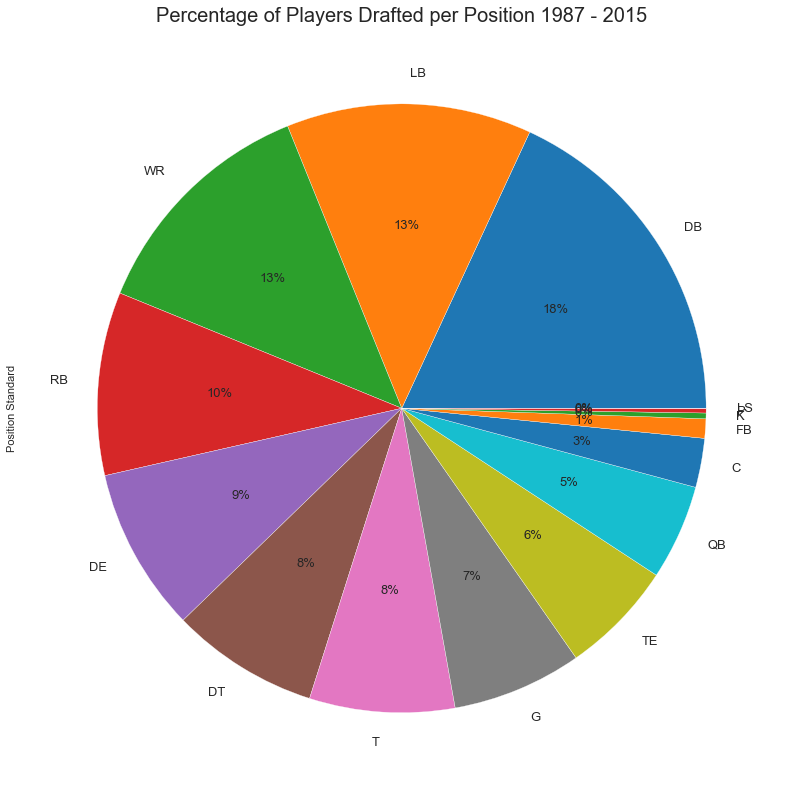

In [102]:
#Showing the % of players drafted per position
plt.figure(figsize=(14, 14));
nfl_positions = df['Position Standard'].value_counts();
nfl_positions.plot(kind='pie', autopct='%1.0f%%', fontsize=13);
plt.title('Percentage of Players Drafted per Position 1987 - 2015', fontsize=20);

### Fitting a Draft Curve
We can fit a curve to take a look at the carAV for each round. We will fit the curve using local regression, which "travels" along the data fitting a curve to small chunks of the data at a time.

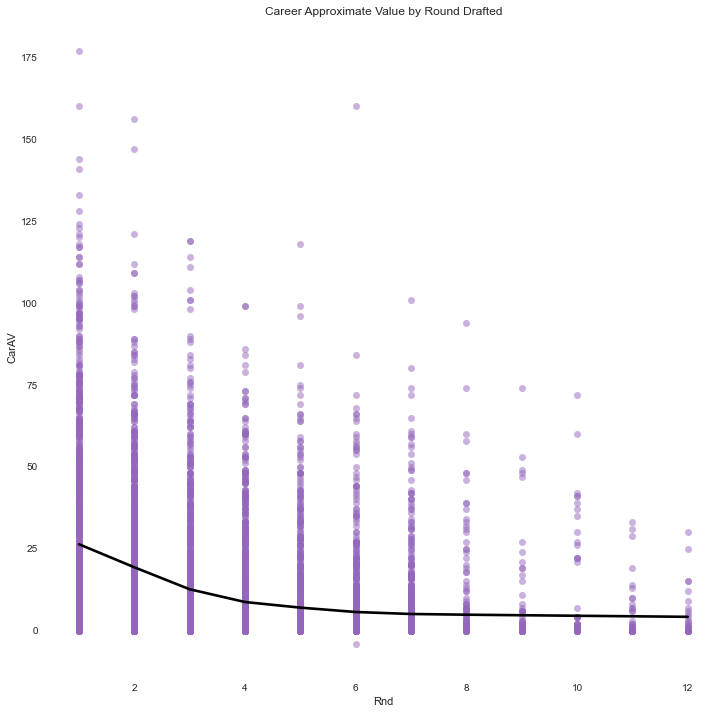

In [94]:
# plot LOWESS curve
# set line color to be black, and scatter color to cyan
sns.regplot(x="Rnd", y="CarAV", data=df, lowess=True,
            line_kws={"color": "black"},
            scatter_kws={"color": sns.color_palette()[4], "alpha": 0.5})
plt.title("Career Approximate Value by Round Drafted")
plt.show()

We can also fit a Lowess curve for each position using lmplot and setting hue to "Position Standard".

C:\Users\public\Anaconda3\lib\site-packages\seaborn\regression.py:546: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\public\Anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:165: RuntimeWarning: invalid value encountered in true_divide
  res = _lowess(y, x, frac=frac, it=it, delta=delta)


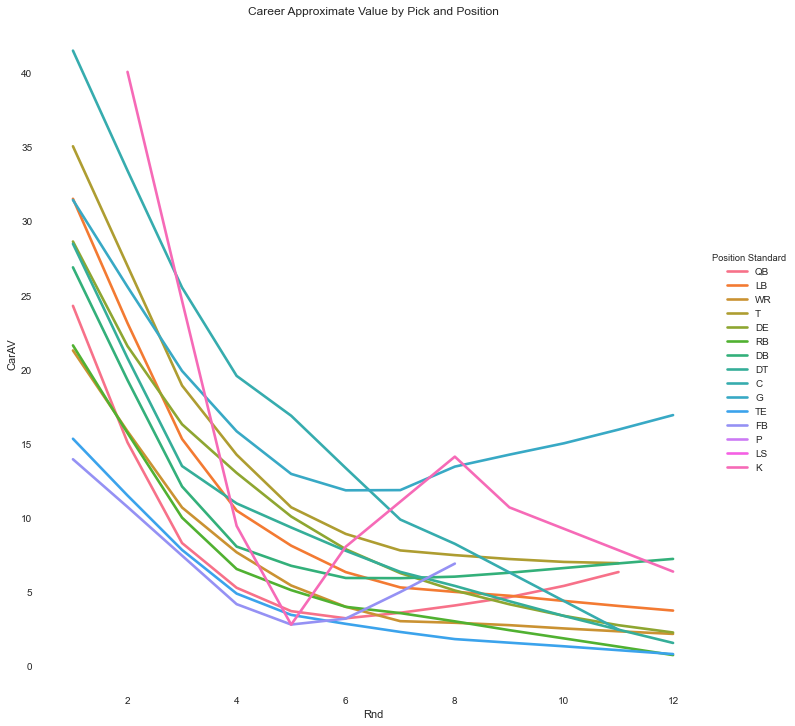

In [97]:
# Fit a LOWESS curver for each position
sns.lmplot(x="Rnd", y="CarAV", data=df, lowess=True, hue="Position Standard",
           size=10, scatter=False)
plt.title("Career Approximate Value by Round and Position")
plt.show()

The above plot is a bit too messy as there are too many lines. We can actually separate the curves out and plot the position curves individually. To do this instead of setting hue to "Position Standard" we can set col to "Position Standard". 

C:\Users\public\Anaconda3\lib\site-packages\seaborn\regression.py:546: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\public\Anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:165: RuntimeWarning: invalid value encountered in true_divide
  res = _lowess(y, x, frac=frac, it=it, delta=delta)


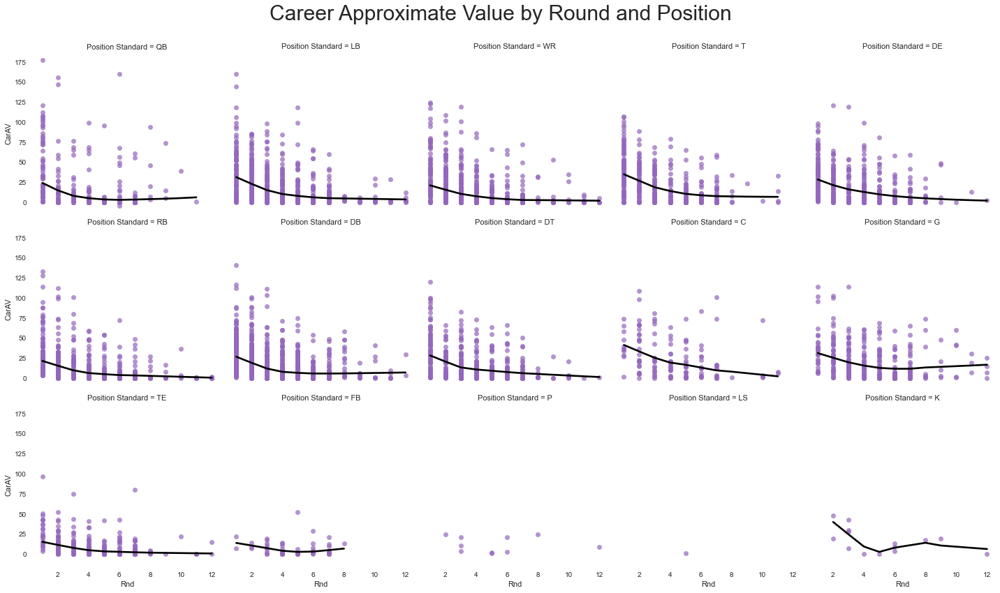

In [99]:
lm = sns.lmplot(x="Rnd", y="CarAV", data=df, lowess=True, col="Position Standard",
                col_wrap=5, size=4, line_kws={"color": "black"},
                scatter_kws={"color": sns.color_palette()[4], "alpha": 0.7})

# add title to the plot (which is a FacetGrid)
# https://stackoverflow.com/questions/29813694/how-to-add-a-title-to-seaborn-facet-plot
plt.subplots_adjust(top=0.9)
lm.fig.suptitle("Career Approximate Value by Round and Position",
                fontsize=30)
plt.show()

We can do the same thing with overall pick in the draft. Maybe this will give us a better insight into the data.  

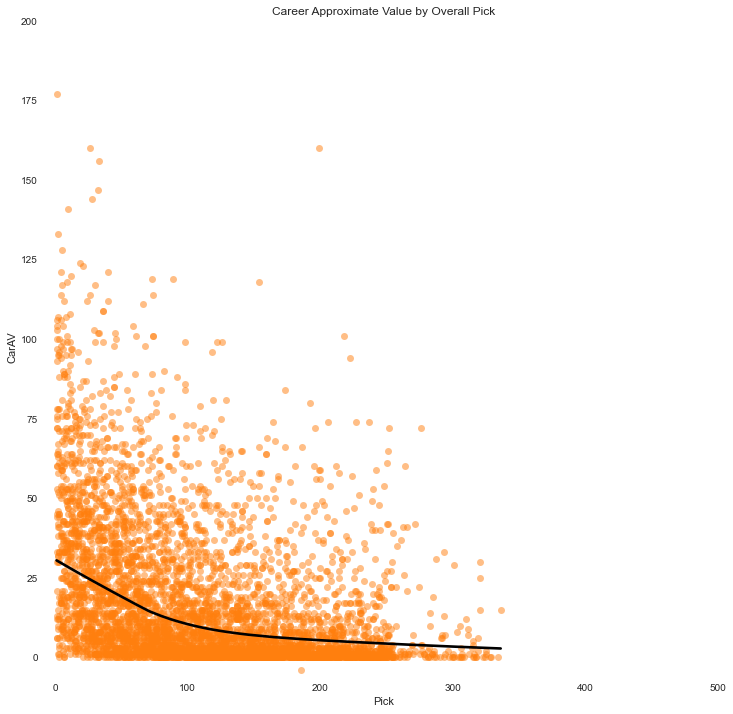

In [299]:
sns.regplot(x="Pick", y="CarAV", data=df, lowess=True,
            line_kws={"color": "black"},
            scatter_kws={"color": sns.color_palette()[1], "alpha": 0.5})
plt.title("Career Approximate Value by Overall Pick")
plt.xlim(-5, 500)
plt.ylim(-5, 200)
plt.show()

C:\Users\public\Anaconda3\lib\site-packages\seaborn\regression.py:546: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\public\Anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:165: RuntimeWarning: invalid value encountered in true_divide
  res = _lowess(y, x, frac=frac, it=it, delta=delta)


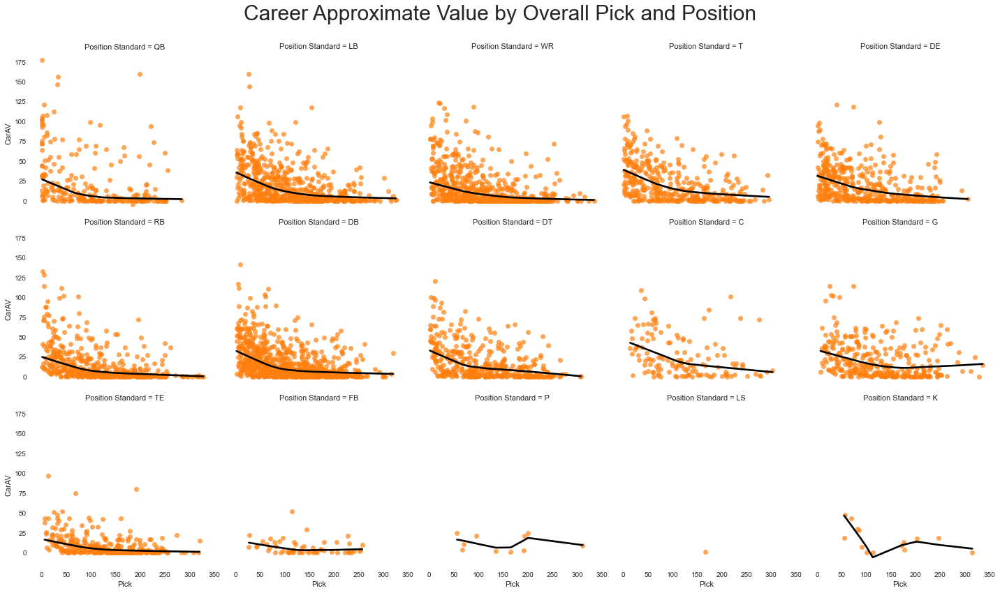

In [302]:
lm = sns.lmplot(x="Pick", y="CarAV", data=df, lowess=True, col="Position Standard",
                col_wrap=5, size=4, line_kws={"color": "black"},
                scatter_kws={"color": sns.color_palette()[1], "alpha": 0.7})

# add title to the plot (which is a FacetGrid)
# https://stackoverflow.com/questions/29813694/how-to-add-a-title-to-seaborn-facet-plot
plt.subplots_adjust(top=0.9)
lm.fig.suptitle("Career Approximate Value by Overall Pick and Position",
                fontsize=30)
plt.show()

From the above plots we can see higher picks generally have more success in the NFL for all positions excluding punters, but there is very little data points for punters drafted. Generally punters and kickers are picked up as free agents. Although there are plenty of examples of players picked lower in the draft that had phenomenal success in the NFL. Tom Brady is one great example. He was picked in the 6th round 199th overall. He is clearly visible in all the graphs as an outlier. 

### College Performance in the NFL

In [172]:
# Filter a dataframe in order to show colleges with the most top picks in the draft
df_counts=df.groupby("College").filter(lambda g: len(g)>80)


Florida State          138
Nebraska               125
Miami (FL)             125
Notre Dame             122
Florida                121
Southern California    111
Oklahoma               106
Georgia                104
Louisiana State        104
Ohio State             104
Tennessee              103
Alabama                101
Texas A&M               98
Michigan                96
Penn State              96
Texas                   88
Auburn                  88
Clemson                 86
North Carolina          83
Iowa                    83
Name: College, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text major ticklabel objects>)

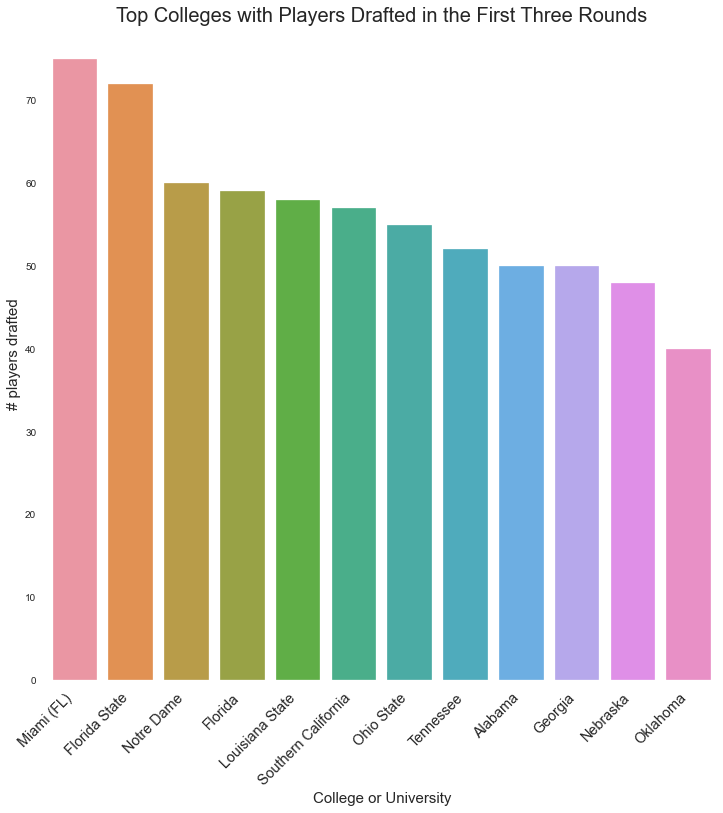

In [192]:
df_counts = df.groupby("College").filter(lambda g: len(g)>100)
df_counts = df_counts[df_counts['Rnd']<=3]
sns.countplot(data=df_counts, x='College', order=df_counts.College.value_counts().index)

plt.xlabel('College', size=15);
plt.ylabel('# players drafted', size=15)
plt.title('Top Colleges with Players Drafted in the First Three Rounds', size=20);
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large'  
)

From the plots above we see only reputable colleges in Power Five conferences are featured. This is no surprise as their is genrally more talent in the Power Five conferences compared to others.

Lets see which colleges produce the best average career appoximate value in the NFL.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]), <a list of 20 Text major ticklabel objects>)

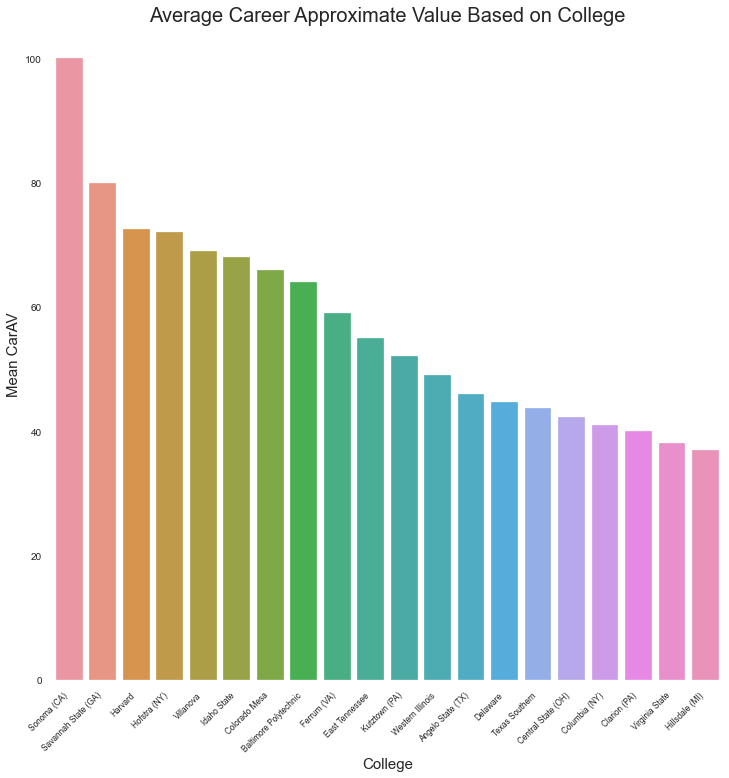

In [511]:
df2 = df.groupby('College')[['CarAV']].mean()
df2.reset_index(level=0, inplace=True)
df2 = df2.sort_values('CarAV',ascending=False)
sns.barplot(data=df2.head(20), x='College',y='CarAV')

plt.xlabel('College', size=15);
plt.ylabel('Mean CarAV', size=15)
plt.title('Average Career Approximate Value Based on College', size=20);
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='small'  
)

It looks like all the top colleges based on approximate value are small, relatively unknown colleges. What's going on here?
It turns out most of these colleges only have one or two players that were drafted and turned out successful in the NFL. The mean, therefore, is not representative of the talent.

Lets look at the same graph filtering for only Power Five colleges.

In [491]:
#create power five column
power5 = ['Illinois',
'Indiana',
'Iowa',
'Maryland',
'Michigan',
'Michigan State',
'Minnesota',
'Nebraska',
'Northwestern',
'Ohio State',
'Penn State',
'Purdue',
'Rutgers',
'Wisconsin','Arkansas',
'LSU',
'Florida',
'Georgia', 
'Tennessee', 
'Auburn',
'Texas A&M',
'Kentucky', 
'Alabama', 
'Vanderbilt', 
'South Carolina', 
'Missouri', 
'Mississippi',
'Mississippi State','Kansas', 'Oklahoma','Texas', 
'Kansas State', 'Oklahoma State', 'Iowa State', 'Baylor', 'Texas Christian', 'Texas Tech', 
'West Virginia','Arizona',
'Arizona State', 
'Colorado',
'Oregon',
'Stanford',
'UCLA',
'USC',
'Washington',
'Washington State',
'Colorado State',
'Utah',
'Oregon State',
'Boston College',
'Clemson',
'Duke',
'Florida State',
'Georgia Tech',
'Louisville',
'Miami',
'North Carolina',
'NC State',
'Wake Forest',
'Syracuse',
'Pittsburgh',
'Virginia',
'Virginia Tech',
'Notre Dame']
df['Power_five'] = df['College'].isin(power5)
                            

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]), <a list of 20 Text major ticklabel objects>)

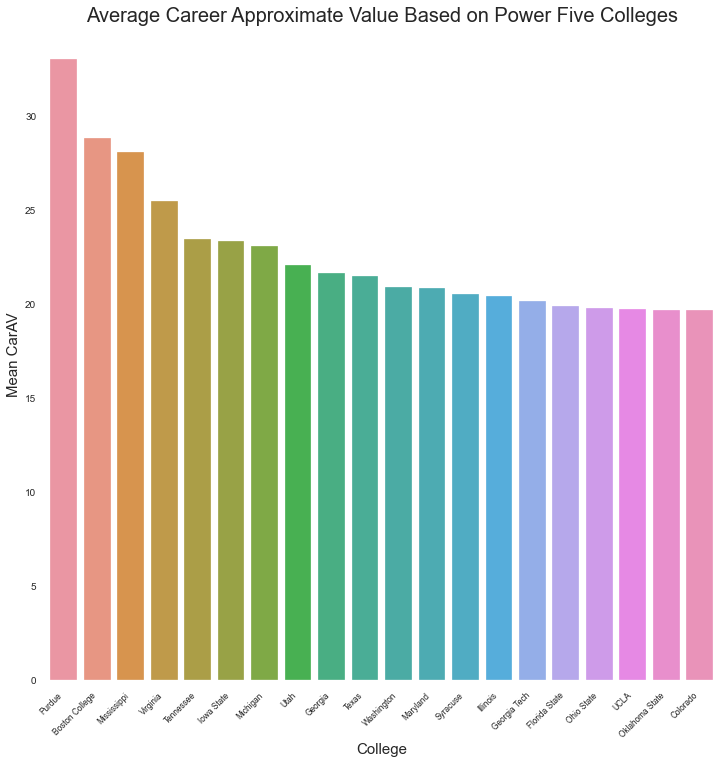

In [510]:
df3 = df[df['Power_five']==True]
df3 = df3.groupby('College')[['CarAV']].mean()
df3.reset_index(level=0, inplace=True)
df3 = df3.sort_values('CarAV',ascending=False)
sns.barplot(data=df3.head(20), x='College',y='CarAV')

plt.xlabel('College', size=15);
plt.ylabel('Mean CarAV', size=15)
plt.title('Average Career Approximate Value Based on Power Five Colleges', size=20);
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='small'  
)

The top power five colleges based on mean Career AV is somewhat surprising to me. The most successful colleges are not necessarily at the top of the list. For example, Purdue hasn't won the Big Ten Championship since 2000 and typically finishes lower in the Big Ten standings every year. 

### Explore Combine Results

First lets take a look at the distribution of the most popular combine stat: the 40 yard sprint.

####  How Have 40 Yard Dash Times Been Trending?
It has been a sentiment seen by many, that NFL players have been getting bigger, stronger and faster.  The graph below would certainly make the case that they are getting faster.  The average forty time has nearly dropped by 0.07 seconds in the last fifteen years.  This may seem like a n extremely small amount, but it is quite meaningful when considering that the range of the full scale is only about 1 second.

(array([1985., 1990., 1995., 2000., 2005., 2010., 2015., 2020.]),
 <a list of 8 Text major ticklabel objects>)

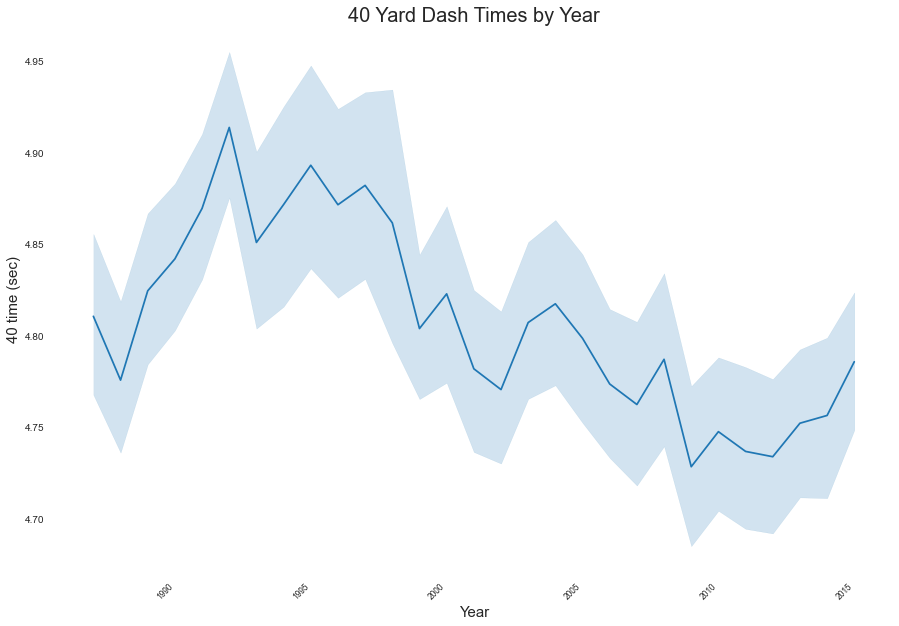

In [370]:
plt.figure(figsize=(15,10))
sns.lineplot(data=df, x='Draft_Year',y='40\xa0Yard')

plt.xlabel('Year', size=15);
plt.ylabel('40 time (sec)', size=15)
plt.title('40 Yard Dash Times by Year', size=20);
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='small'  
)

#### Does a Player's 40 Yard Dash Time Impact Where a Player is Drafted?
There is a linear shaped relationship between a skill position players (WR, RB, DB) forty time and when he is selected in the draft.  The faster the 40 time, the lower the draft pick.

(array([-50.,   0.,  50., 100., 150., 200., 250., 300., 350., 400.]),
 <a list of 10 Text major ticklabel objects>)

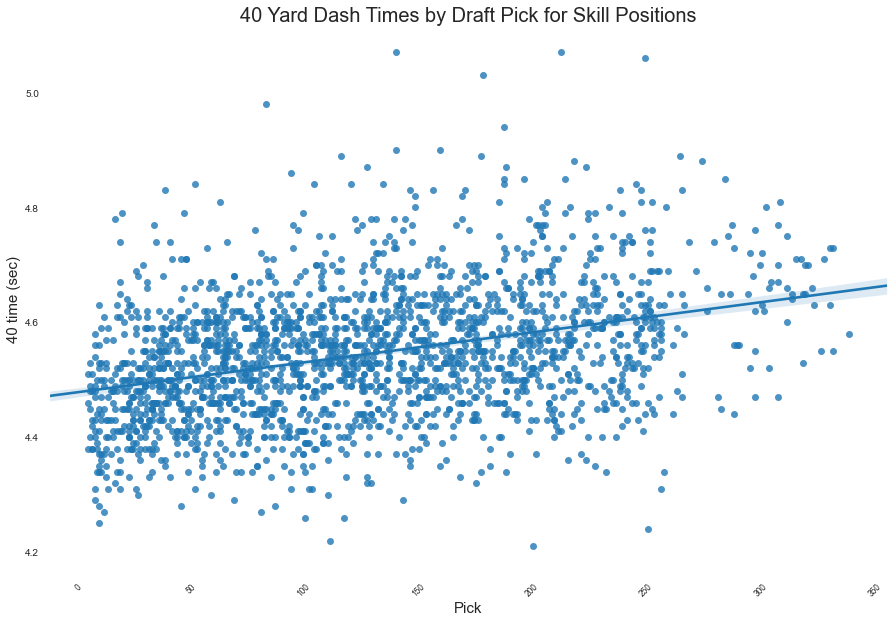

In [404]:
plt.figure(figsize=(15,10))
sns.regplot(data=df[(df['Position Standard']=='RB')| (df['Position Standard']=='WR')| (df['Position Standard']=='DB')], 
            x='Pick',y='40\xa0Yard')

plt.xlabel('Pick', size=15);
plt.ylabel('40 time (sec)', size=15)
plt.title('40 Yard Dash Times by Draft Pick for Skill Positions', size=20);
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='small'  
)

That's not true for every position though. A position like offesnive guard has no relationship bewteen a higher draft pick and a better 40 time. This is to be expected offensive lineman aren't required to be fast in the NFL.

(array([-50.,   0.,  50., 100., 150., 200., 250., 300., 350.]),
 <a list of 9 Text major ticklabel objects>)

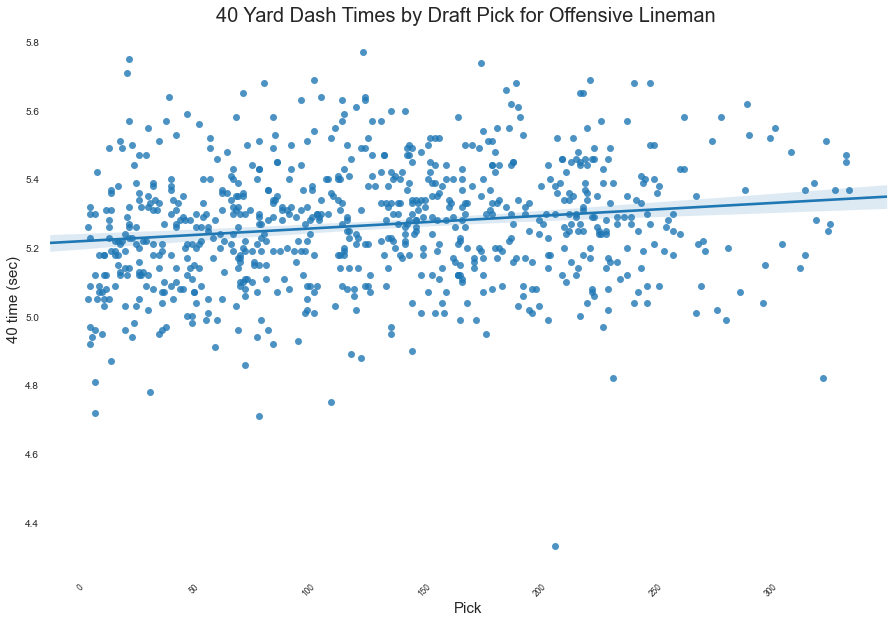

In [406]:
plt.figure(figsize=(15,10))
sns.regplot(data=df[(df['Position Standard']=='G') | (df['Position Standard']=='T')], x='Pick',y='40\xa0Yard')

plt.xlabel('Pick', size=15);
plt.ylabel('40 time (sec)', size=15)
plt.title('40 Yard Dash Times by Draft Pick for Offensive Lineman ', size=20);
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='small'  
)

Lineman are required to be strong though. Let's see if Bench press reps and draft position have any correlation with each other for offesive lineman

(array([-50.,   0.,  50., 100., 150., 200., 250., 300., 350., 400.]),
 <a list of 10 Text major ticklabel objects>)

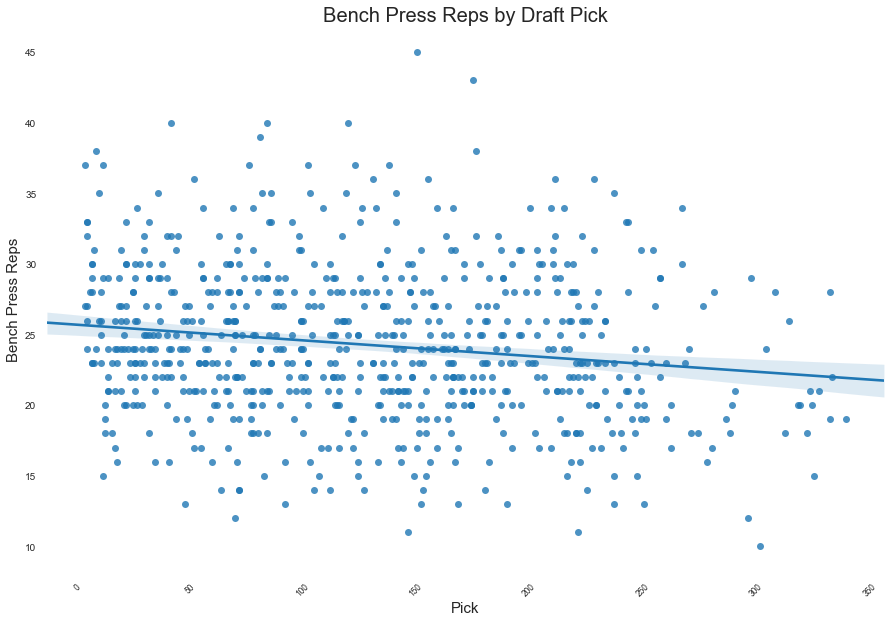

In [398]:
plt.figure(figsize=(15,10))
sns.regplot(data=df[(df['Position Standard']=='T') | (df['Position Standard']=='G')], x='Pick',y='Bench Press')
plt.xlabel('Pick', size=15);
plt.ylabel('Bench Press Reps', size=15)
plt.title('Bench Press Reps by Draft Pick', size=20);
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='small'  
)

There is  not as strong as a relationship between draft pick and the number of reps in lineman than there is bewteen draft pick and 40 time in skill position players. 

#### Distribution of 40 times by Position

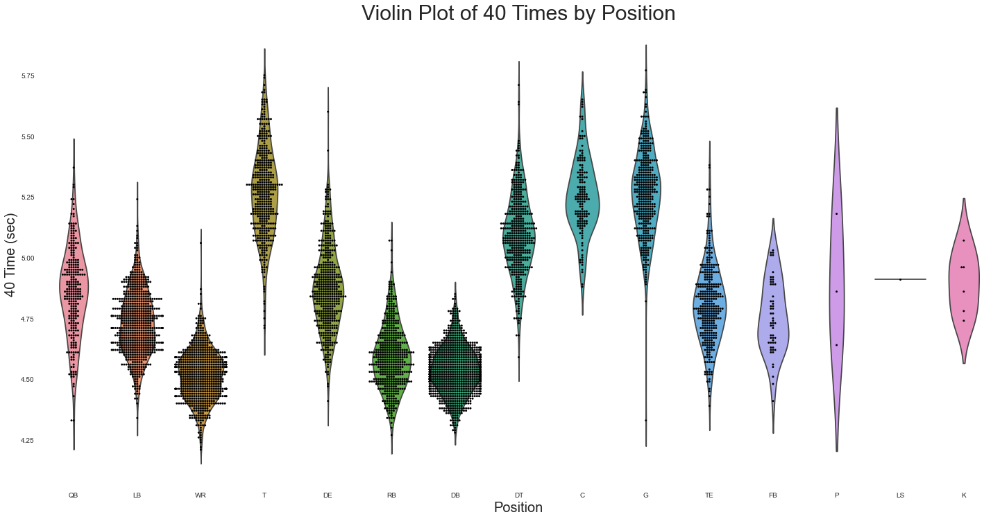

In [236]:

g = sns.catplot(x="Position Standard", y="40\xa0Yard", kind="violin", inner=None, data=df,height=10,aspect=2)
sns.swarmplot(x="Position Standard", y="40\xa0Yard", color="k", size=3, data=df, ax=g.ax);
plt.xlabel('Position', size=20);
plt.ylabel('40 Time (sec)', size=20)
plt.title('Violin Plot of 40 Times by Position', size=30);


In [467]:
#Create new column for distribution of 40 times
conditions = [(df['40\xa0Yard']<= 4.4),
             (df['40\xa0Yard']>= 4.41) & (df['40\xa0Yard'] <=4.5),
              (df['40\xa0Yard']>= 4.51) & (df['40\xa0Yard'] <=4.6),
              (df['40\xa0Yard']>= 4.61) & (df['40\xa0Yard'] <=4.7),
              (df['40\xa0Yard']>= 4.71) & (df['40\xa0Yard'] <=4.8),
              (df['40\xa0Yard']>= 4.81) & (df['40\xa0Yard'] <=4.9),
              (df['40\xa0Yard']>= 4.91) & (df['40\xa0Yard'] <=5.0),
              (df['40\xa0Yard']>= 5.01) & (df['40\xa0Yard'] <=5.1),
              (df['40\xa0Yard']>= 5.11) & (df['40\xa0Yard'] <=5.2),
              (df['40\xa0Yard']>= 5.21) & (df['40\xa0Yard'] <=5.3),
              (df['40\xa0Yard']>= 5.31) & (df['40\xa0Yard'] <=5.4),
              (df['40\xa0Yard']>= 5.41) & (df['40\xa0Yard'] <=5.5),
              (df['40\xa0Yard']>= 5.51) & (df['40\xa0Yard'] <=5.6),
              (df['40\xa0Yard']>= 5.61) & (df['40\xa0Yard'] <=5.7),
             ]
values = ['4.0-4.4','4.41-4.5','4.51-4.6','4.61-4.7','4.71-4.8','4.81-4.9',
          '4.91-5.0','5.01-5.1','5.11-5.2','5.21-5.3','5.31-5.4','5.41-5.5',
          '5.51-5.6','5.61-5.7'
         ]
df['40_dist'] = np.select(conditions, values)

In [473]:
df['40_dist'].replace('0', np.nan,inplace=True)

In [446]:
# Create new column compacting positons
conditions1 = [(df['Position Standard']== 'DB') | (df['Position Standard']=='WR') | (df['Position Standard']=='RB'),
              (df['Position Standard']== 'C') | (df['Position Standard']=='G') | (df['Position Standard']=='T') | (df['Position Standard']=='LS'),
              (df['Position Standard']== 'DE') | (df['Position Standard']=='DT'),
              (df['Position Standard']== 'K') | (df['Position Standard']=='P'),
              (df['Position Standard']== 'FB') | (df['Position Standard']=='LB') | (df['Position Standard']=='TE'),
              (df['Position Standard']== 'QB') ]
values1 = ['Skill Players','Offensive Lineman','Defensive Lineman','Kicker/Punter','LB/FB/TE','QB']
df['Pos'] = np.select(conditions1, values1)


Text(0.5, 1.0, 'Distribution of 40 Times')

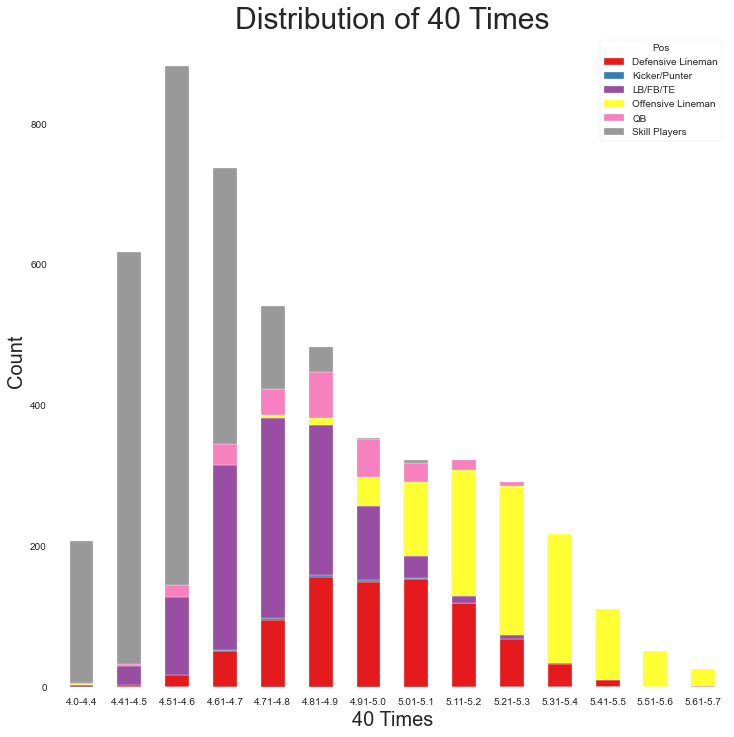

In [482]:
df[df['40_dist']==0] =np.nan
df.groupby(['40_dist','Pos']).size().unstack('Pos').plot.bar(stacked=True,colormap='Set1')
values[ values==0 ] = np.nan
plt.xlabel('40 Times', size=20);
plt.ylabel('Count', size=20)
plt.xticks(rotation=0)
plt.title('Distribution of 40 Times', size=30)

From the plots above it's clear skill players perform the best at the 40 yard dash.  Again, no surprise here, skill players typically weigh less and are more athletic than other positions. 

###  Data Correlations

In [22]:
#Create pairplot
#sns_plot = sns.pairplot(df, size=2.0)
#sns_plot.savefig("pairplot.png")

#plt.clf() # Clean parirplot figure from sns 

C:\Users\public\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


NameError: name 'Image' is not defined

<Figure size 5472x5472 with 0 Axes>

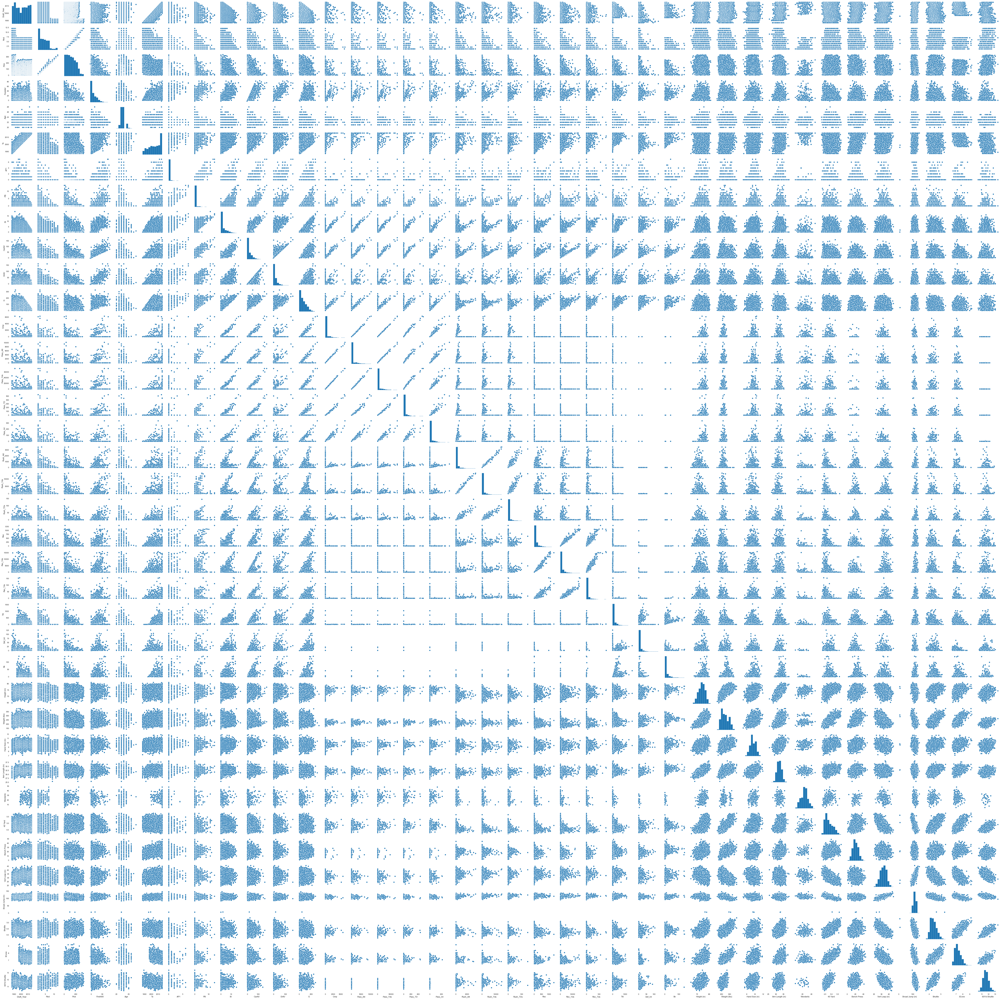

In [24]:
Image(filename='pairplot.png') # Show pairplot as image

In [20]:
#Create Pearson Correlation Matrix
#Calculate the correlation coefficients
corr = df.corr(method ='pearson')
#plot it in the next line
corr.round(2).style.background_gradient(cmap='coolwarm')